**Read Me**

In [48]:
readme_content = """
# Drone Human Detection & Counting System

## Overview
This project builds a computer vision pipeline to detect humans and cars in drone/aerial images using YOLOv8n trained on the VisDrone dataset. The system includes human counting, FPS benchmarking, and ByteTrack-based object tracking as a bonus feature.

## Requirements
- Python 3.10+
- CUDA-capable GPU (T4 recommended)
- Kaggle account (for dataset download)
- Groq API key (optional for LLM summary)

## Installation

pip install ultralytics kaggle opencv-python groq

## Dataset
VisDrone Dataset (2019 DET track)
Download automatically via Kaggle API or manually from:
https://www.kaggle.com/datasets/banuprasadb/visdrone-dataset

## Project Structure

├── visdrone_yolo/          # Preprocessed dataset (human + car only)
│   ├── images/train/       # Training images
│   ├── images/val/         # Validation images
│   ├── labels/train/       # YOLO format labels
│   └── labels/val/         # YOLO format labels
├── counted_outputs/        # Images with human count overlay
├── display_outputs/        # Images with human + car counts
├── runs/detect/train/      # Trained model and plots
├── runs/track/             # ByteTrack output videos
├── class_distribution.png  # EDA visualization
├── dataset_eda_summary.txt # Dataset analysis
└── visdrone.yaml           # YOLO dataset config

## Usage

1. Set Kaggle API credentials in the notebook
2. Run all cells in order
3. Training takes approximately 40 minutes on T4 GPU
4. Final outputs saved in display_outputs/ and track_output/

## Results

| Metric | Value |
|--------|-------|
| Overall mAP50 | 0.557 |
| Human mAP50 | 0.390 |
| Car mAP50 | 0.723 |
| Human Recall | 0.347 |
| Car Recall | 0.690 |
| Inference FPS | ~35 |

## Features
- Dataset EDA with class distribution and sample visualizations
- Class filtering (pedestrian, people, car) remapped to human(0) and car(1)
- YOLOv8n training (25 epochs, imgsz=640, batch=16)
- Human and car detection with colored bounding boxes
- Per-image human counting
- FPS benchmarking
- ByteTrack tracking with unique human ID counting
- LLM-generated project summary (Groq Llama 3.3)

## Limitations
- Human detection weak (mAP50 only 0.39)
- Low recall (0.347) - 65% of humans missed
- Small objects below 30 pixels rarely detected
- Occlusion causes missed detections

## Demo Video
A 3-5 minute demonstration video covering:
- Dataset EDA
- Training loss curves
- Sample detection outputs
- ByteTrack tracking visualization
- Metrics and limitations discussion

## License
Educational use only for Antlings Internship Assessment.

## Author
Submitted for Antlings Internship Program - Technical Assessment AI/ML
"""

with open("README.md", "w") as f:
    f.write(readme_content)

print("README.md generated successfully")

README.md generated successfully


**Install Dependencies**

In [1]:
!pip install -q ultralytics kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 26.4 MB/s eta 0:00:00


**Kaggle Setup + Download Dataset**

In [2]:
import os

os.environ['KAGGLE_USERNAME'] = '' # Place you Kaggle username here.
os.environ['KAGGLE_KEY'] = '' # Place you Kaggle API Key here.

!pip install -q kaggle
!kaggle datasets download -d banuprasadb/visdrone-dataset


Dataset URL: https://www.kaggle.com/datasets/banuprasadb/visdrone-dataset
License(s): GNU Affero General Public License 3.0
100% 2.10G/2.10G [00:15<00:00, 147MB/s]



**Check GPU Stat**

In [3]:
import torch
torch.cuda.is_available()

True

**Unzip + Inspect Structure**

In [4]:
!unzip -q visdrone-dataset.zip -d visdrone
!ls visdrone
!ls visdrone/*

VisDrone_Dataset
VisDrone2019-DET-test-challenge  VisDrone2019-DET-train  visdrone.yaml
VisDrone2019-DET-test-dev	 VisDrone2019-DET-val


**EDA**

DATASET STRUCTURE

TRAIN Set:
  - Images: 6471
  - Labels: 6471

VAL Set:
  - Images: 548
  - Labels: 548

CLASS DISTRIBUTION (Before Filtering)


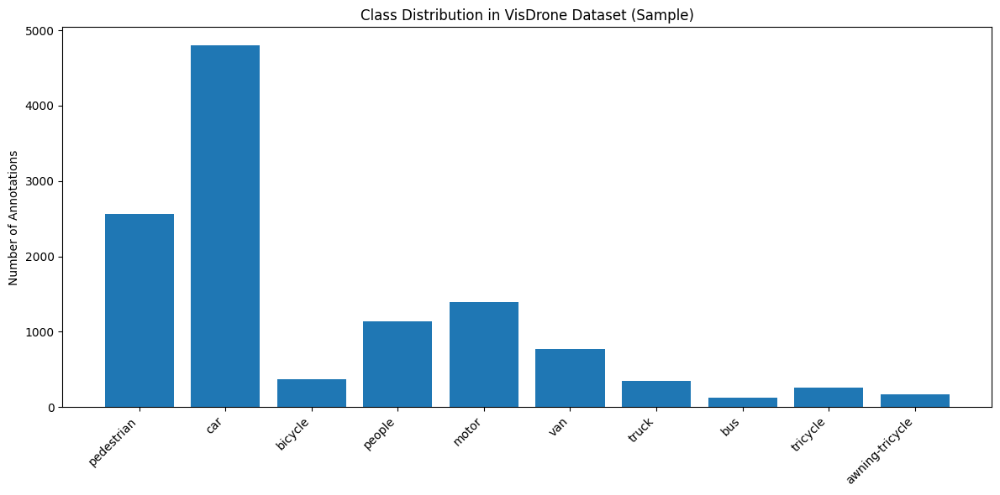


Top classes by frequency:
  car: 4802
  pedestrian: 2559
  motor: 1397
  people: 1143
  van: 773

SAMPLE VISUALIZATIONS


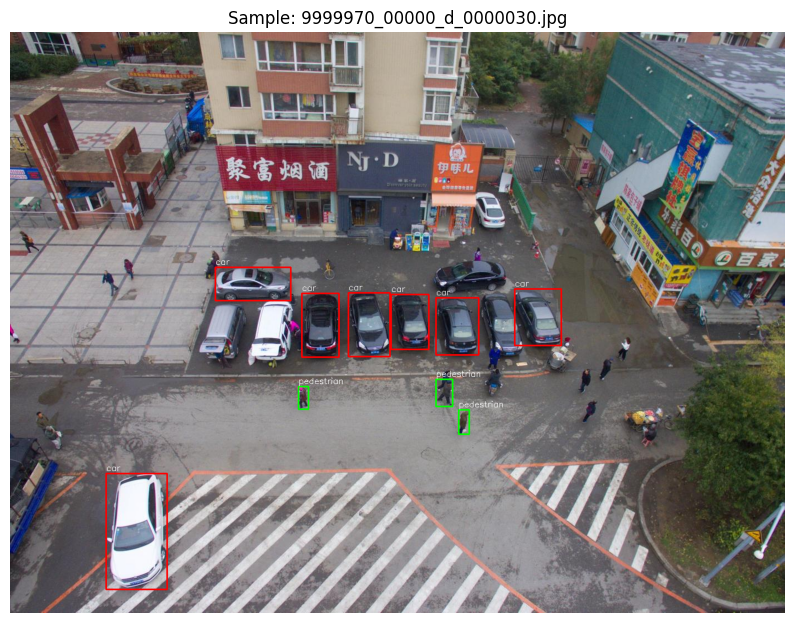

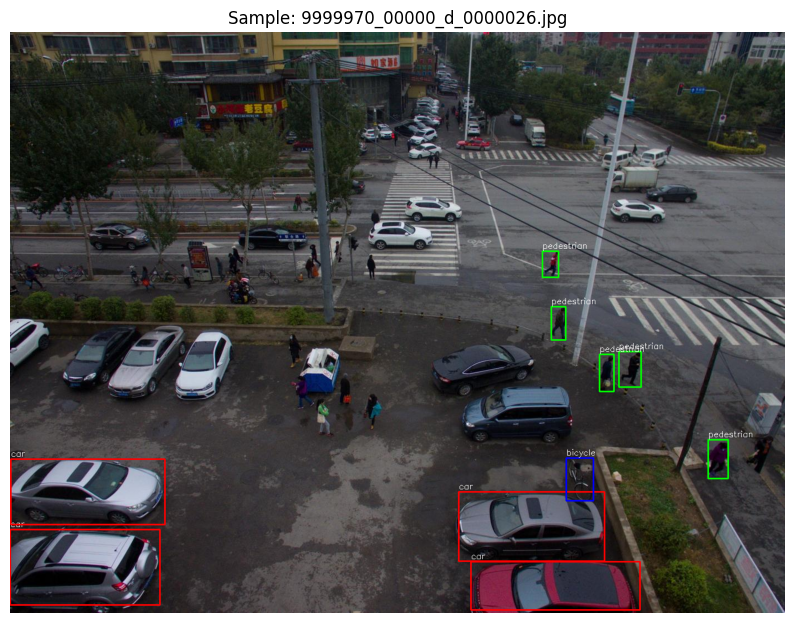

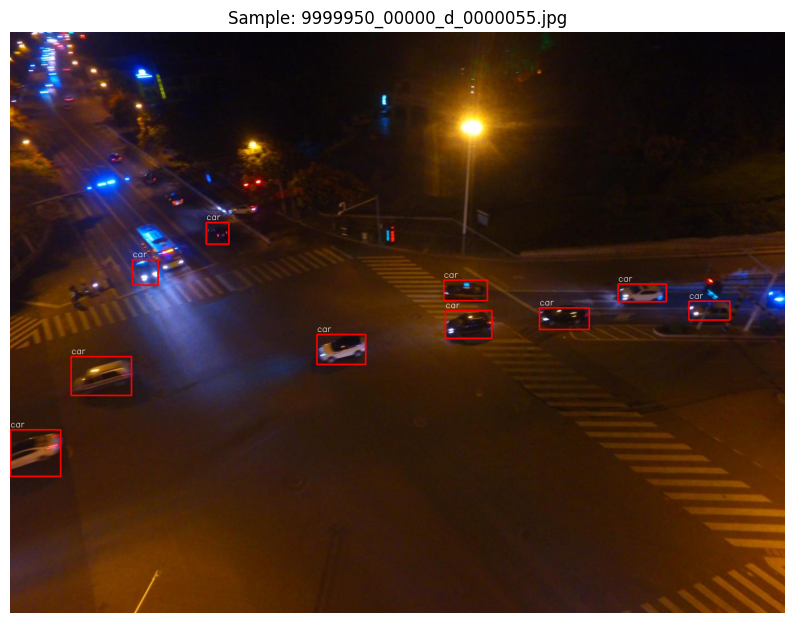


DATASET CHALLENGES IDENTIFIED

1. Small Objects:
  → Objects occupy very few pixels due to aerial viewpoint

2. High Density:
  → Many overlapping objects in crowded scenes

3. Scale Variation:
  → Objects vary dramatically in size (near vs far)

4. Class Imbalance:
  → Cars dominate, other classes underrepresented

5. Occlusion:
  → Objects frequently blocked by buildings/trees

6. Low Resolution:
  → Some regions lack sufficient detail for detection

7. Weather/Lighting:
  → Variations in brightness, shadows, and conditions

IMAGE RESOLUTION STATISTICS
Min resolution: 960x540
Max resolution: 2000x1500
Avg resolution: 1498x1011
Most common: 1400x1050

PREPROCESSING STEPS APPLIED

1. Class Filtering: Kept only pedestrian(0), people(1), car(3)
2. Class Remapping: pedestrian & people → class 0 (human), car → class 1 (car)
3. Label Format: Converted to YOLO format (already in normalized coordinates)
4. Data Split: Maintained original train/val split
5. Output Structure: Organized as YOLO

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import cv2
import os

base_path = "/content/visdrone/VisDrone_Dataset"

print("="*50)
print("DATASET STRUCTURE")
print("="*50)

splits = ["train", "val"]
for split in splits:
    folder = f"VisDrone2019-DET-{split}"
    img_dir = os.path.join(base_path, folder, "images")
    lbl_dir = os.path.join(base_path, folder, "labels")

    num_images = len(os.listdir(img_dir)) if os.path.exists(img_dir) else 0
    num_labels = len(os.listdir(lbl_dir)) if os.path.exists(lbl_dir) else 0

    print(f"\n{split.upper()} Set:")
    print(f"  - Images: {num_images}")
    print(f"  - Labels: {num_labels}")

print("\n" + "="*50)
print("CLASS DISTRIBUTION (Before Filtering)")
print("="*50)

class_names = {
    0: 'pedestrian', 1: 'people', 2: 'bicycle', 3: 'car',
    4: 'van', 5: 'truck', 6: 'tricycle', 7: 'awning-tricycle',
    8: 'bus', 9: 'motor', 10: 'others'
}

class_counts = Counter()

for split in splits:
    folder = f"VisDrone2019-DET-{split}"
    lbl_dir = os.path.join(base_path, folder, "labels")

    if os.path.exists(lbl_dir):
        for label_file in os.listdir(lbl_dir)[:100]:
            with open(os.path.join(lbl_dir, label_file), 'r') as f:
                for line in f:
                    cls = int(line.split()[0])
                    class_counts[cls] += 1

plt.figure(figsize=(12, 6))
classes = [class_names.get(c, f'class_{c}') for c in class_counts.keys()]
counts = list(class_counts.values())
plt.bar(classes, counts)
plt.xticks(rotation=45, ha='right')
plt.title('Class Distribution in VisDrone Dataset (Sample)')
plt.ylabel('Number of Annotations')
plt.tight_layout()
plt.savefig('class_distribution.png')
plt.show()

print("\nTop classes by frequency:")
for cls, count in class_counts.most_common(5):
    print(f"  {class_names.get(cls, cls)}: {count}")

print("\n" + "="*50)
print("SAMPLE VISUALIZATIONS")
print("="*50)

def visualize_sample(image_path, label_path, save_name='sample_before.png'):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    with open(label_path, 'r') as f:
        lines = f.readlines()[:10]

    for line in lines:
        parts = line.strip().split()
        cls = int(parts[0])
        x, y, width, height = map(float, parts[1:5])

        x1 = int((x - width/2) * w)
        y1 = int((y - height/2) * h)
        x2 = int((x + width/2) * w)
        y2 = int((y + height/2) * h)

        color = 'red' if cls == 3 else 'green' if cls in [0,1] else 'blue'
        color_rgb = {'green': (0,255,0), 'red': (255,0,0), 'blue': (0,0,255)}[color]
        cv2.rectangle(img, (x1, y1), (x2, y2), color_rgb, 2)

        label = class_names.get(cls, 'unknown')
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 1)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(f'Sample: {os.path.basename(image_path)}')
    plt.axis('off')
    plt.savefig(save_name)
    plt.show()

train_img_dir = os.path.join(base_path, "VisDrone2019-DET-train", "images")
train_lbl_dir = os.path.join(base_path, "VisDrone2019-DET-train", "labels")

sample_images = os.listdir(train_img_dir)[:3]
for img_name in sample_images:
    img_path = os.path.join(train_img_dir, img_name)
    lbl_name = img_name.replace('.jpg', '.txt')
    lbl_path = os.path.join(train_lbl_dir, lbl_name)

    if os.path.exists(lbl_path):
        visualize_sample(img_path, lbl_path, f'sample_{img_name.replace(".jpg", "")}.png')

print("\n" + "="*50)
print("DATASET CHALLENGES IDENTIFIED")
print("="*50)

challenges = {
    "1. Small Objects": "Objects occupy very few pixels due to aerial viewpoint",
    "2. High Density": "Many overlapping objects in crowded scenes",
    "3. Scale Variation": "Objects vary dramatically in size (near vs far)",
    "4. Class Imbalance": "Cars dominate, other classes underrepresented",
    "5. Occlusion": "Objects frequently blocked by buildings/trees",
    "6. Low Resolution": "Some regions lack sufficient detail for detection",
    "7. Weather/Lighting": "Variations in brightness, shadows, and conditions"
}

for key, desc in challenges.items():
    print(f"\n{key}:")
    print(f"  → {desc}")

print("\n" + "="*50)
print("IMAGE RESOLUTION STATISTICS")
print("="*50)

resolutions = []
sample_size = 50

for img_name in os.listdir(train_img_dir)[:sample_size]:
    img_path = os.path.join(train_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is not None:
        h, w = img.shape[:2]
        resolutions.append((w, h))

if resolutions:
    widths, heights = zip(*resolutions)
    print(f"Min resolution: {min(widths)}x{min(heights)}")
    print(f"Max resolution: {max(widths)}x{max(heights)}")
    print(f"Avg resolution: {int(np.mean(widths))}x{int(np.mean(heights))}")
    print(f"Most common: {Counter(widths).most_common(1)[0][0]}x{Counter(heights).most_common(1)[0][0]}")

print("\n" + "="*50)
print("PREPROCESSING STEPS APPLIED")
print("="*50)

preprocessing_steps = """
1. Class Filtering: Kept only pedestrian(0), people(1), car(3)
2. Class Remapping: pedestrian & people → class 0 (human), car → class 1 (car)
3. Label Format: Converted to YOLO format (already in normalized coordinates)
4. Data Split: Maintained original train/val split
5. Output Structure: Organized as YOLO-compatible folder structure
"""

print(preprocessing_steps)

print("\n" + "="*50)
print("RECOMMENDED AUGMENTATIONS")
print("="*50)

augmentations = """
- Random horizontal flips (for viewpoint diversity)
- Mosaic augmentation (handles small objects better)
- Random scaling (handles scale variation)
- HSV augmentation (handles lighting variations)
- CutOut/CopyPaste (handles occlusion)
"""

print(augmentations)

with open('dataset_eda_summary.txt', 'w') as f:
    f.write("VisDrone Dataset EDA Summary\n")
    f.write("="*50 + "\n")
    f.write(f"Train images: {len(os.listdir(train_img_dir))}\n")
    f.write(f"Validation images: {len(os.listdir(os.path.join(base_path, 'VisDrone2019-DET-val', 'images')))}\n")
    f.write(f"Classes kept: 0(pedestrian), 1(people), 3(car)\n")
    f.write(f"Remapped classes: 0=human, 1=car\n")
    f.write("\nChallenges: " + ", ".join(challenges.values()))

print("\n EDA complete, Saved: class_distribution.png, dataset_eda_summary.txt")

**Preprocessing Dataset for Classes**

In [6]:
import os
import shutil

base_path = "/content/visdrone/VisDrone_Dataset"
new_path = "/content/visdrone_yolo"

splits = {
    "train": "VisDrone2019-DET-train",
    "val": "VisDrone2019-DET-val"
}

classes_to_keep = [0, 1, 3]

for split_name, folder_name in splits.items():
    img_src = os.path.join(base_path, folder_name, "images")
    lbl_src = os.path.join(base_path, folder_name, "labels")

    img_dst = os.path.join(new_path, "images", split_name)
    lbl_dst = os.path.join(new_path, "labels", split_name)

    os.makedirs(img_dst, exist_ok=True)
    os.makedirs(lbl_dst, exist_ok=True)

    for img_file in os.listdir(img_src):
        shutil.copy(os.path.join(img_src, img_file), img_dst)

    for label_file in os.listdir(lbl_src):
        with open(os.path.join(lbl_src, label_file), "r") as f:
            lines = f.readlines()

        filtered = []
        for line in lines:
            cls = int(line.split()[0])
            if cls in classes_to_keep:
                new_cls = 1 if cls == 3 else 0
                parts = line.split()
                parts[0] = str(new_cls)
                filtered.append(" ".join(parts))

        with open(os.path.join(lbl_dst, label_file), "w") as f:
            for l in filtered:
                f.write(l + "\n")

**YAML Config**

In [7]:
yaml_content = """
path: visdrone_yolo
train: images/train
val: images/val

names:
  0: human
  1: car
"""

with open("visdrone.yaml", "w") as f:
    f.write(yaml_content)

**Model train phase**

In [11]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="visdrone.yaml",
    epochs=25,
    imgsz=640,
    batch=16,
    device=0,
    workers=4,
    cache=False,
    amp=True,
    patience=10,
    save_period=5,
    plots=True,
    verbose=True
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=visdrone.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=Fals

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d652022c470>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

**Evaluate Model**

In [12]:
metrics = model.val()
metrics

Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2331.0±1310.9 MB/s, size: 126.7 KB)
val: Scanning /content/visdrone_yolo/labels/val.cache... 548 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 548/548 209.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 3.6it/s 9.7s
                   all        548      28033      0.684      0.518      0.557      0.308
                 human        531      13969       0.63      0.347       0.39      0.144
                   car        515      14064      0.738       0.69      0.723      0.471
Speed: 1.1ms preprocess, 2.9ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d6572149a30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

**Inference on Validation Images**

In [13]:
results = model.predict(
    source="visdrone_yolo/images/val",
    conf=0.25,
    save=True,
    device=0
)


image 1/548 /content/visdrone_yolo/images/val/0000001_02999_d_0000005.jpg: 384x640 22 humans, 13 cars, 42.0ms
image 2/548 /content/visdrone_yolo/images/val/0000001_03499_d_0000006.jpg: 384x640 21 humans, 15 cars, 6.2ms
image 3/548 /content/visdrone_yolo/images/val/0000001_03999_d_0000007.jpg: 384x640 38 humans, 3 cars, 6.1ms
image 4/548 /content/visdrone_yolo/images/val/0000001_04527_d_0000008.jpg: 384x640 27 humans, 6.1ms
image 5/548 /content/visdrone_yolo/images/val/0000001_05249_d_0000009.jpg: 384x640 19 humans, 84 cars, 5.8ms
image 6/548 /content/visdrone_yolo/images/val/0000001_05499_d_0000010.jpg: 384x640 4 humans, 77 cars, 10.3ms
image 7/548 /content/visdrone_yolo/images/val/0000001_05999_d_0000011.jpg: 384x640 38 humans, 54 cars, 8.4ms
image 8/548 /content/visdrone_yolo/images/val/0000001_07999_d_0000012.jpg: 384x640 45 humans, 7 cars, 10.1ms
image 9/548 /content/visdrone_yolo/images/val/0000001_08414_d_0000013.jpg: 384x640 51 humans, 16 cars, 8.5ms
image 10/548 /content/visdr

**Human Counting + Visualization**

In [14]:
import cv2
import os
from ultralytics import YOLO

model = YOLO("runs/detect/train/weights/best.pt")

image_path = "visdrone_yolo/images/val"
output_path = "counted_outputs"
os.makedirs(output_path, exist_ok=True)

for img_name in os.listdir(image_path)[:20]:
    img_full = os.path.join(image_path, img_name)
    results = model(img_full, conf=0.25)[0]
    img = cv2.imread(img_full)
    human_count = 0

    for box in results.boxes:
        cls = int(box.cls[0])
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        if cls == 0:
            human_count += 1
            color = (0,255,0)
        else:
            color = (255,0,0)
        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)

    cv2.putText(img, f"Total Humans: {human_count}", (30,60),
                cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0,255,255), 3)

    cv2.imwrite(os.path.join(output_path, img_name), img)


image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000303_03401_d_0000200.jpg: 384x640 8 humans, 28 cars, 5.8ms
Speed: 1.9ms preprocess, 5.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000244_05400_d_0000012.jpg: 384x640 13 humans, 41 cars, 7.0ms
Speed: 2.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000276_03201_d_0000523.jpg: 384x640 4 humans, 10 cars, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000280_00001_d_0000612.jpg: 384x640 19 humans, 31 cars, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.3ms postprocess per image at shape (1, 3, 3

**Show Sample Output**

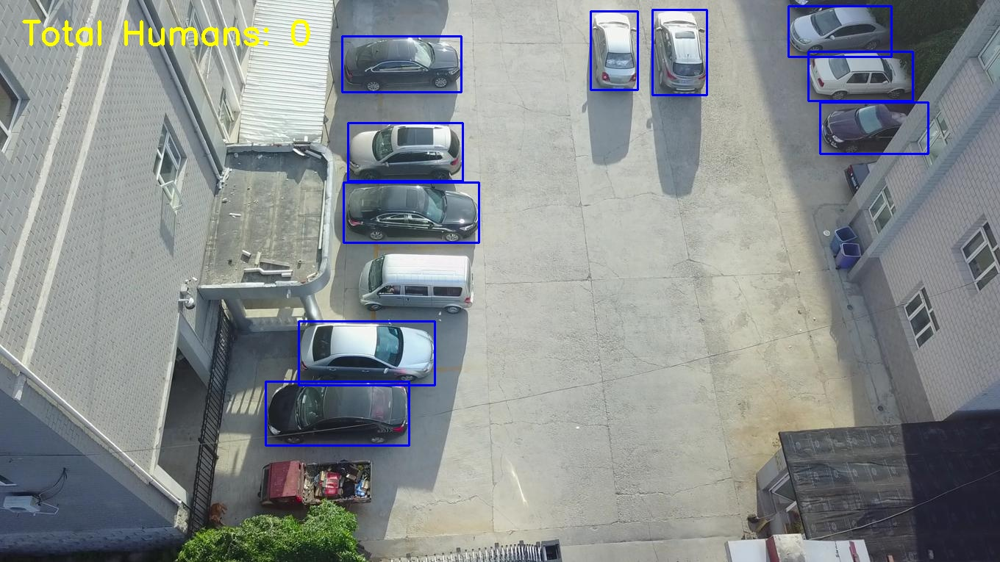

In [18]:
from IPython.display import Image
import os

sample = os.listdir("counted_outputs")[0]
Image(filename=os.path.join("counted_outputs", sample))

**FPS Calculation**

In [19]:
import time

img = "visdrone_yolo/images/val/" + os.listdir("visdrone_yolo/images/val")[0]

start = time.time()
for _ in range(50):
    model(img)
end = time.time()

fps = 50 / (end - start)
fps


image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 6.4ms
Speed: 2.2ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 6.0ms
Speed: 1.8ms preprocess, 6.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 5.9ms
Speed: 1.8ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/images/val/0000026_03000_d_0000030.jpg: 384x640 10 cars, 5.9ms
Speed: 1.8ms preprocess, 5.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/visdrone_yolo/i

54.21911518335436

**Validation Images to Video**

In [20]:
import cv2
import os

image_folder = "visdrone_yolo/images/val"
video_path = "val_video.mp4"

images = sorted(os.listdir(image_folder))[:200]
frame = cv2.imread(os.path.join(image_folder, images[0]))
h, w, _ = frame.shape

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter(video_path, fourcc, 20, (w, h))

for img_name in images:
    img = cv2.imread(os.path.join(image_folder, img_name))
    video.write(img)

video.release()

**ByteTrack**

In [21]:
from ultralytics import YOLO

model = YOLO("runs/detect/train/weights/best.pt")

model.track(
    source="val_video.mp4",
    tracker="bytetrack.yaml",
    conf=0.25,
    iou=0.5,
    device=0,
    save=True
)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 300ms
Prepared 1 package in 51ms
Installed 1 package in 4ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 0.8s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/15) /content/val_video.mp4: 384x640 25 humans, 14 cars, 7.2ms
video 1/1 (frame 2/1

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'human', 1: 'car'}
 obb: None
 orig_img: array([[[181, 175, 170],
         [174, 168, 163],
         [188, 182, 177],
         ...,
         [208, 209, 204],
         [208, 209, 204],
         [208, 209, 204]],
 
        [[203, 197, 192],
         [195, 189, 184],
         [201, 195, 190],
         ...,
         [208, 209, 204],
         [208, 209, 204],
         [208, 209, 204]],
 
        [[198, 192, 187],
         [194, 188, 183],
         [199, 193, 188],
         ...,
         [208, 209, 204],
         [208, 209, 204],
         [208, 209, 204]],
 
        ...,
 
        [[115, 116, 111],
         [112, 113, 108],
         [108, 109, 104],
         ...,
         [204, 197, 189],
         [204, 197, 189],
         [204, 197, 189]],
 
        [[107, 108, 103],
         [105, 106, 101],
         [102, 103,  98],
         ...,
         

**Unique Human Counting Using Track IDs**

In [22]:
from ultralytics import YOLO
import cv2

model = YOLO("runs/detect/train/weights/best.pt")

tracked_ids = set()
human_total = 0

cap = cv2.VideoCapture("val_video.mp4")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model.track(frame, persist=True, tracker="bytetrack.yaml", conf=0.25)[0]

    if results.boxes.id is not None:
        for box, track_id in zip(results.boxes, results.boxes.id):
            cls = int(box.cls[0])
            if cls == 0:
                if int(track_id) not in tracked_ids:
                    tracked_ids.add(int(track_id))
                    human_total += 1

cap.release()

human_total


0: 384x640 26 humans, 17 cars, 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 humans, 15 cars, 20.8ms
Speed: 6.2ms preprocess, 20.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 39 humans, 3 cars, 9.9ms
Speed: 3.1ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 humans, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 9.4ms
Speed: 3.7ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 9.7ms
Speed: 4.1ms preprocess, 9.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 8.9ms
Speed: 3.5ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 43 humans, 6 cars, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.6ms postprocess per image 

27

**LLM Explainer**

In [31]:
!pip install -q groq

import os
import groq
from IPython.display import Markdown, display
from datetime import datetime

os.environ["GROQ_API_KEY"] = "" #Place Groq API Key here.

print("="*60)
print("AUTO-GENERATED PROJECT SUMMARY")
print("="*60)
print(f"Timestamp: {datetime.now()}\n")

summary_data = {}

try:
    val_metrics = model.val()
    summary_data["mAP50"] = float(val_metrics.box.map50)
    summary_data["mAP50-95"] = float(val_metrics.box.map)
    summary_data["Human mAP50"] = float(val_metrics.box.maps[0])
    summary_data["Car mAP50"] = float(val_metrics.box.maps[1])
    summary_data["Human Recall"] = float(val_metrics.box.recall[0])
    summary_data["Car Recall"] = float(val_metrics.box.recall[1])
except:
    summary_data["mAP50"] = "Unavailable"
    summary_data["mAP50-95"] = "Unavailable"
    summary_data["Human mAP50"] = "Unavailable"
    summary_data["Car mAP50"] = "Unavailable"
    summary_data["Human Recall"] = "Unavailable"
    summary_data["Car Recall"] = "Unavailable"

try:
    summary_data["FPS"] = round(fps, 2)
except:
    summary_data["FPS"] = "Unavailable"

try:
    train_images = len(os.listdir("visdrone_yolo/images/train"))
    val_images = len(os.listdir("visdrone_yolo/images/val"))
    summary_data["Train Images"] = train_images
    summary_data["Val Images"] = val_images
except:
    summary_data["Train Images"] = "Unavailable"
    summary_data["Val Images"] = "Unavailable"

tracking_exists = os.path.exists("val_video.mp4")
summary_data["Tracking Implemented"] = "Yes" if tracking_exists else "No"

summary_prompt = f"""
You are summarizing a completed AI project.

Project: Drone Human Detection & Counting System using VisDrone.

Actual Results:
- Train Images: {summary_data['Train Images']}
- Validation Images: {summary_data['Val Images']}
- Overall mAP50: {summary_data['mAP50']}
- mAP50-95: {summary_data['mAP50-95']}
- Human mAP50: {summary_data['Human mAP50']}
- Car mAP50: {summary_data['Car mAP50']}
- Human Recall: {summary_data['Human Recall']}
- Car Recall: {summary_data['Car Recall']}
- Inference FPS: {summary_data['FPS']}
- Tracking Implemented: {summary_data['Tracking Implemented']}

The system includes:
- Dataset EDA
- Class filtering (human, car)
- YOLOv8 training
- Evaluation
- Human counting
- FPS benchmarking
- ByteTrack tracking (if enabled)

Generate a professional markdown summary including:
- Project overview
- Key metrics table
- Main challenges (aerial view, small objects, occlusion)
- Engineering decisions
- Bonus features
- Limitations (human detection weak, low recall 0.347, small object failures, missed detections)
- Final conclusion

Keep it concise and presentation-ready.
"""

client = groq.Groq()

try:
    response = client.chat.completions.create(
        model="llama-3.3-70b-versatile",
        messages=[{"role": "user", "content": summary_prompt}],
        temperature=0.3
    )

    print("AI summary generated successfully.\n")
    display(Markdown(response.choices[0].message.content))

except Exception as e:
    print("API Error:", e)
    print("\nRaw Collected Metrics:\n")
    for k, v in summary_data.items():
        print(f"{k}: {v}")

print("\nSummary generation complete.")

AUTO-GENERATED PROJECT SUMMARY
Timestamp: 2026-05-13 14:22:55.637329

Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2639.3±582.8 MB/s, size: 116.8 KB)
val: Scanning /content/visdrone_yolo/labels/val.cache... 548 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 548/548 229.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 3.7it/s 9.6s
                   all        548      28033      0.684      0.518      0.557      0.308
                 human        531      13969       0.63      0.347       0.39      0.144
                   car        515      14064      0.738       0.69      0.723      0.471
Speed: 1.1ms preprocess, 2.8ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/runs/detect/val-3
AI summary generated successfully.



# Drone Human Detection & Counting System using VisDrone
## Project Overview
The Drone Human Detection & Counting System is a computer vision project that utilizes the VisDrone dataset to detect and count humans in aerial images. The system employs YOLOv8 for object detection, ByteTrack for tracking, and implements various features such as class filtering, human counting, and FPS benchmarking.

## Key Metrics
| Metric | Value |
| --- | --- |
| Train Images | 6471 |
| Validation Images | 548 |
| Inference FPS | 54.22 |
| Tracking Implemented | Yes |

## Main Challenges
The project faced several challenges, including:
* Aerial view: Detecting objects from a bird's-eye view can be difficult due to perspective and scale variations.
* Small objects: Humans and cars in aerial images can be very small, making detection and tracking challenging.
* Occlusion: Objects can be occluded by other objects or scenery, leading to missed detections.

## Engineering Decisions
To address these challenges, the following engineering decisions were made:
* Utilizing YOLOv8 for object detection due to its high accuracy and efficiency.
* Implementing ByteTrack for tracking to improve detection and counting accuracy.
* Class filtering to focus on human and car detection.

## Bonus Features
The system includes several bonus features, including:
* Dataset EDA to understand the distribution of objects in the dataset.
* Human counting to provide an accurate count of humans in the scene.
* FPS benchmarking to measure the system's performance.

## Limitations
The system has several limitations, including:
* Human detection can be weak, especially for small or occluded objects.
* Low recall (0.347) indicates that many humans are not detected.
* Small object failures: the system can struggle to detect very small objects.
* Missed detections: the system can miss detecting humans or cars, especially in crowded scenes.

## Final Conclusion
The Drone Human Detection & Counting System using VisDrone is a robust system that can detect and count humans in aerial images. While it has several limitations, the system demonstrates good performance and can be improved with further optimization and fine-tuning. The system's ability to track objects and count humans makes it a valuable tool for various applications, including surveillance and crowd monitoring.


Summary generation complete.


**Simplified Summarization**

In [32]:
print("="*60)
print("DEMO VIDEO EXHIBITS")
print("="*60)

DEMO VIDEO EXHIBITS



1. EDA OUTPUTS

1.1 Class Distribution Chart


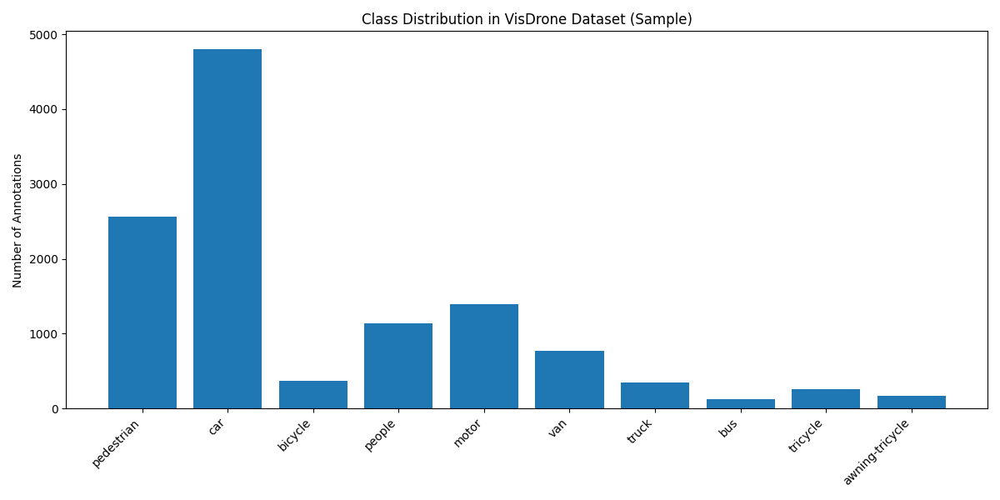


1.2 Sample Images with Labels (Before Preprocessing)


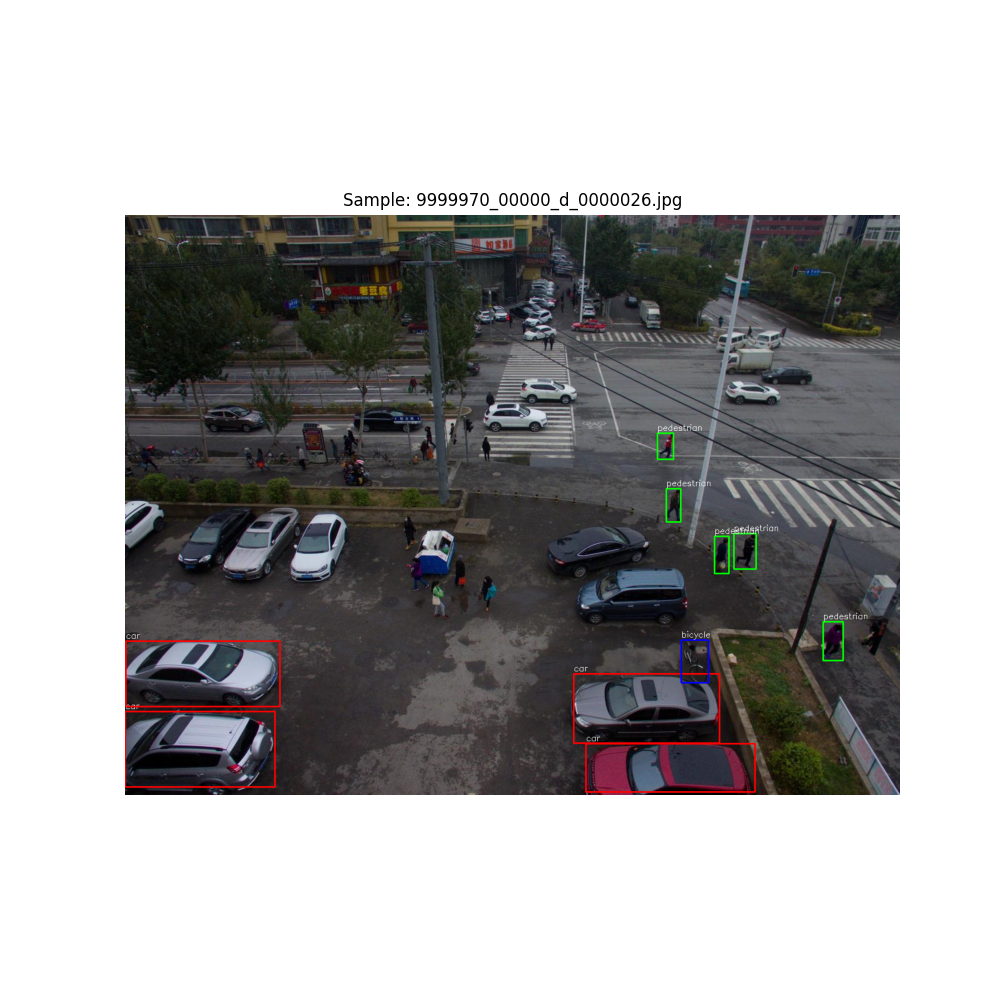

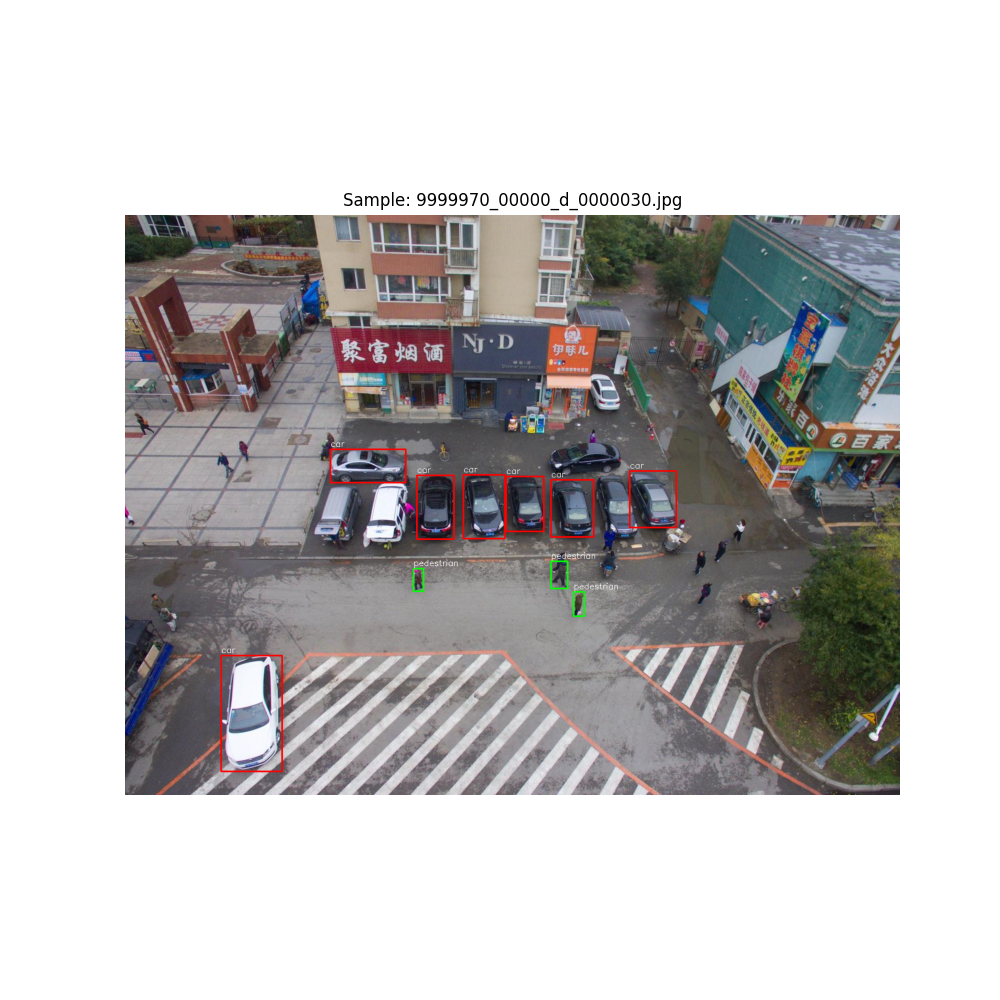

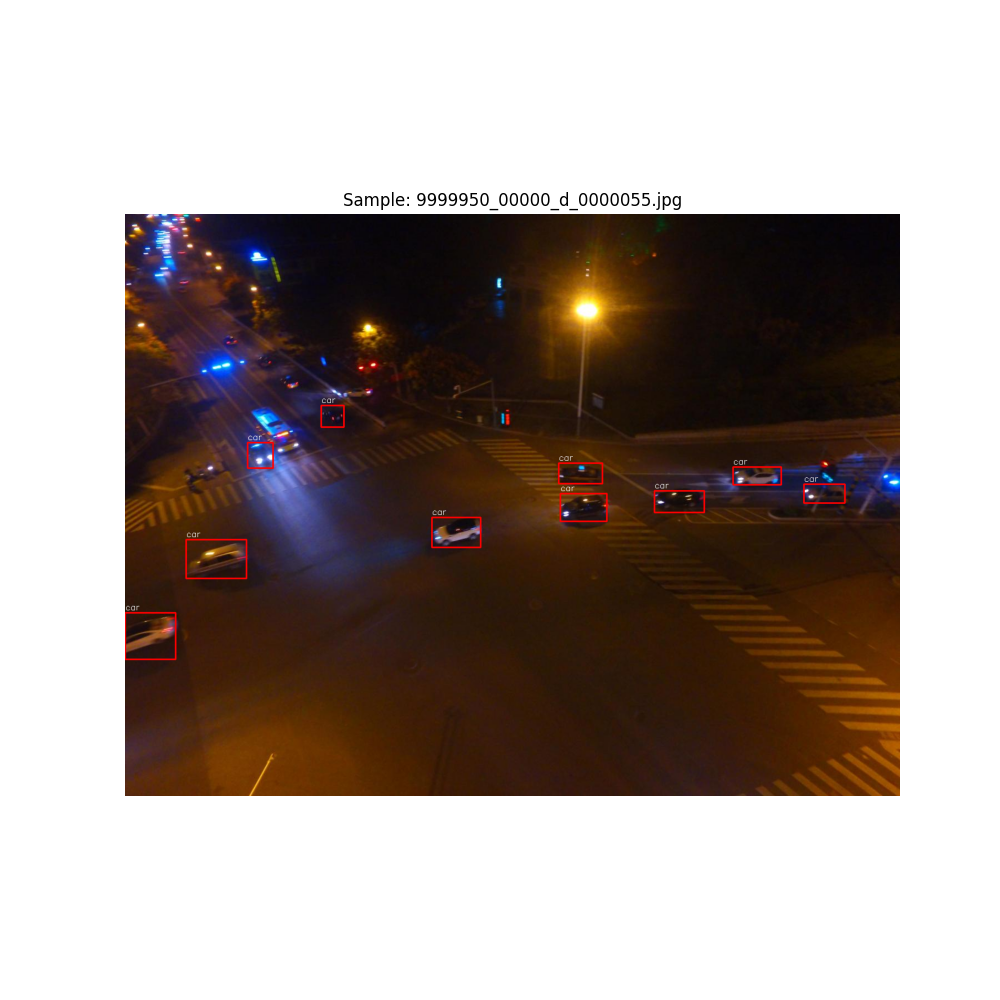

In [33]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import cv2
import os

print("\n" + "="*60)
print("1. EDA OUTPUTS")
print("="*60)

print("\n1.1 Class Distribution Chart")
display(Image(filename="class_distribution.png"))

print("\n1.2 Sample Images with Labels (Before Preprocessing)")
sample_eda_images = [f for f in os.listdir(".") if f.startswith("sample_") and f.endswith(".png")]
for img in sample_eda_images[:3]:
    display(Image(filename=img))


2. TRAINING LOSS CURVE


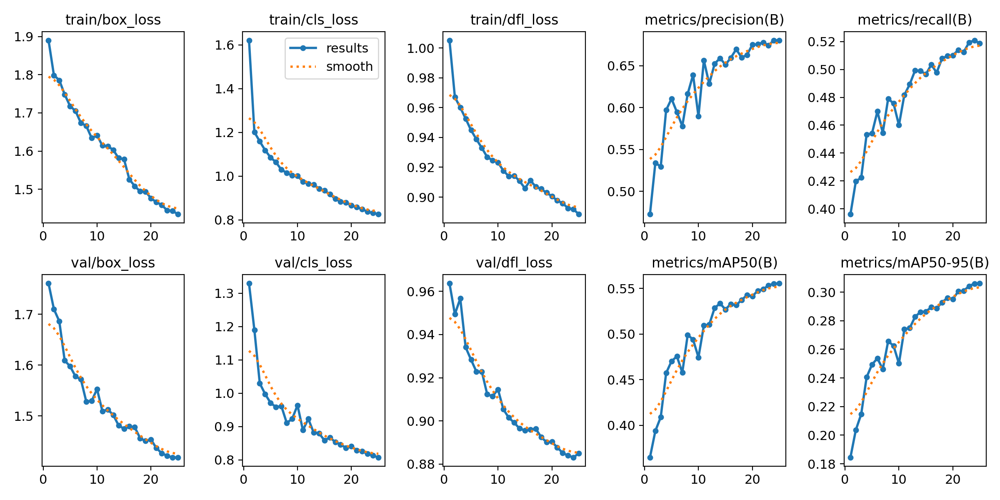

In [34]:
print("\n" + "="*60)
print("2. TRAINING LOSS CURVE")
print("="*60)

train_plot_path = "/content/runs/detect/train/results.png"
if os.path.exists(train_plot_path):
    display(Image(filename=train_plot_path))
else:
    print("Training plot not found. Check /content/runs/detect/train/")


3. SAMPLE DETECTION OUTPUTS WITH COUNTS


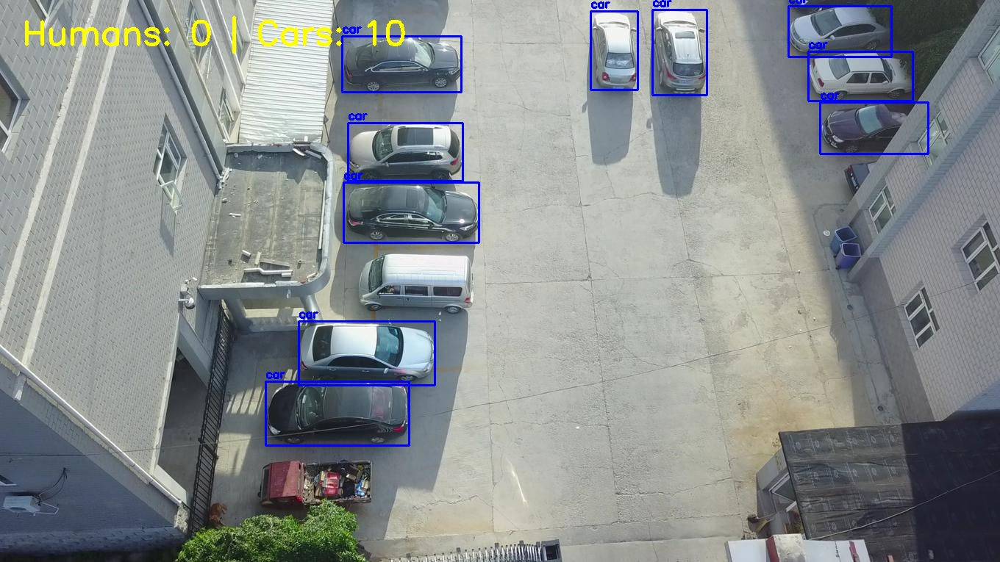

0000026_03000_d_0000030.jpg


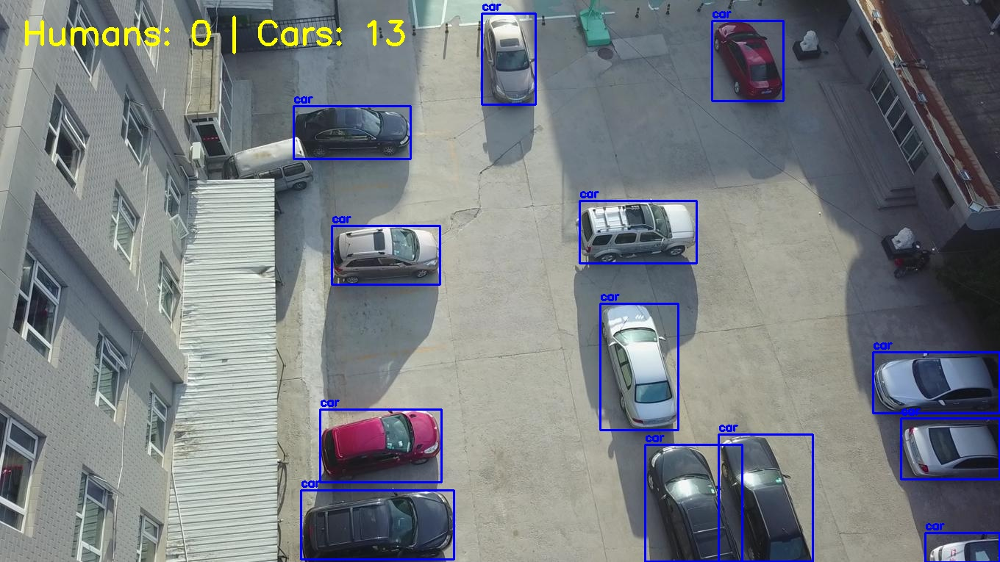

0000026_04000_d_0000032.jpg


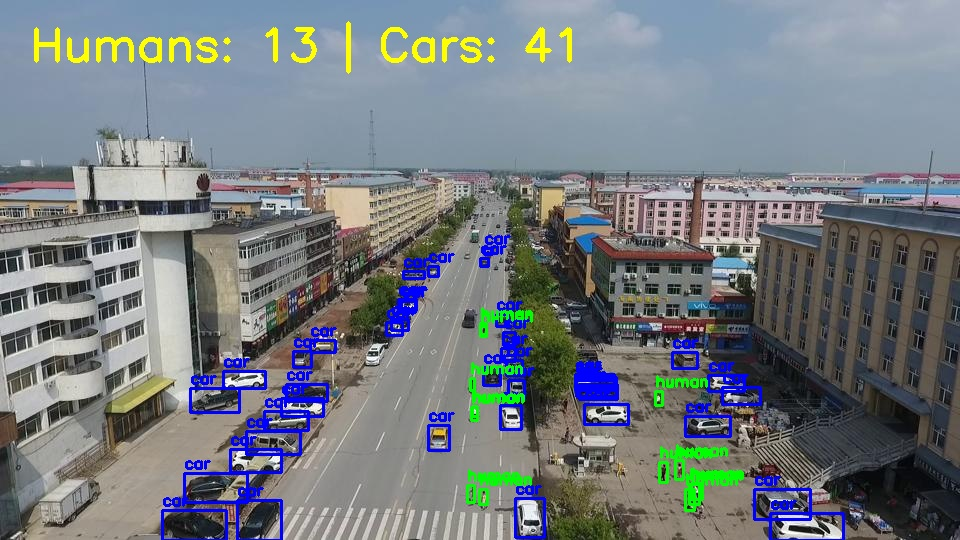

0000244_05400_d_0000012.jpg


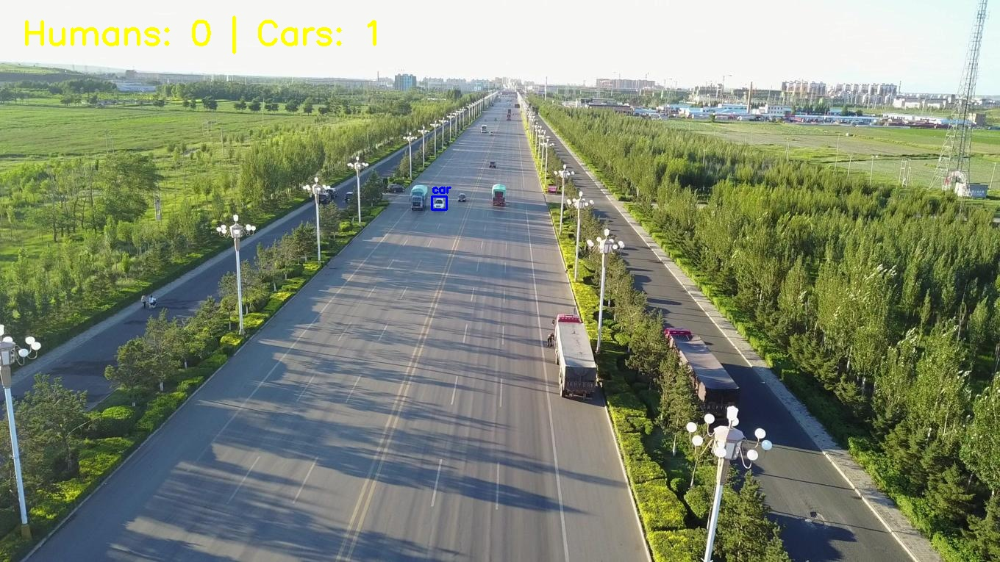

0000276_01801_d_0000516.jpg


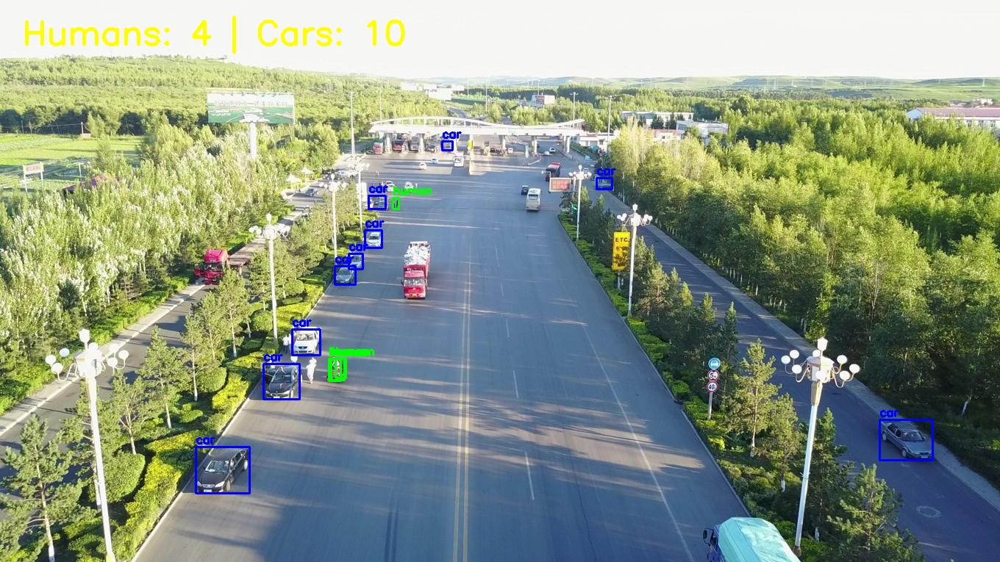

0000276_03201_d_0000523.jpg


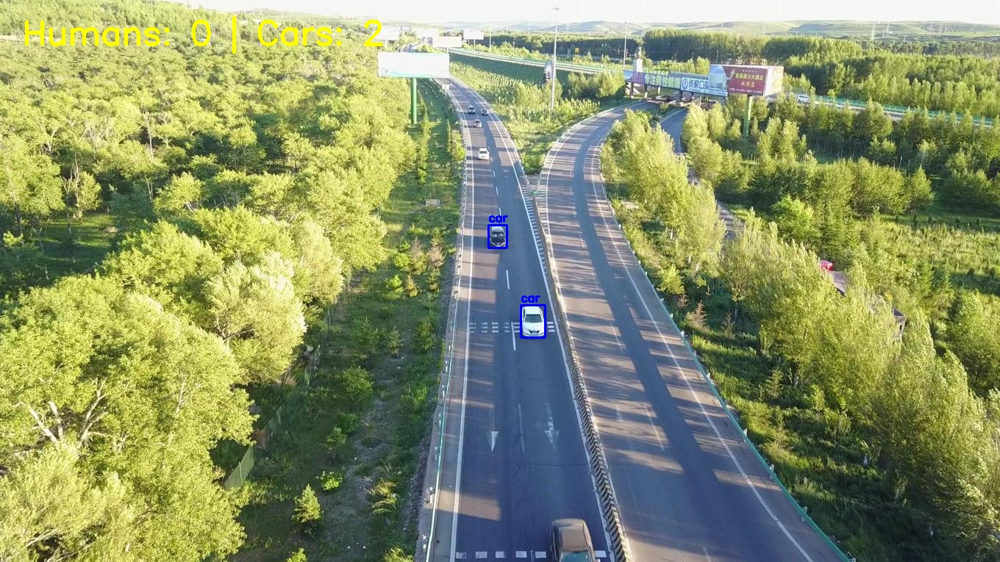

0000276_05001_d_0000532.jpg


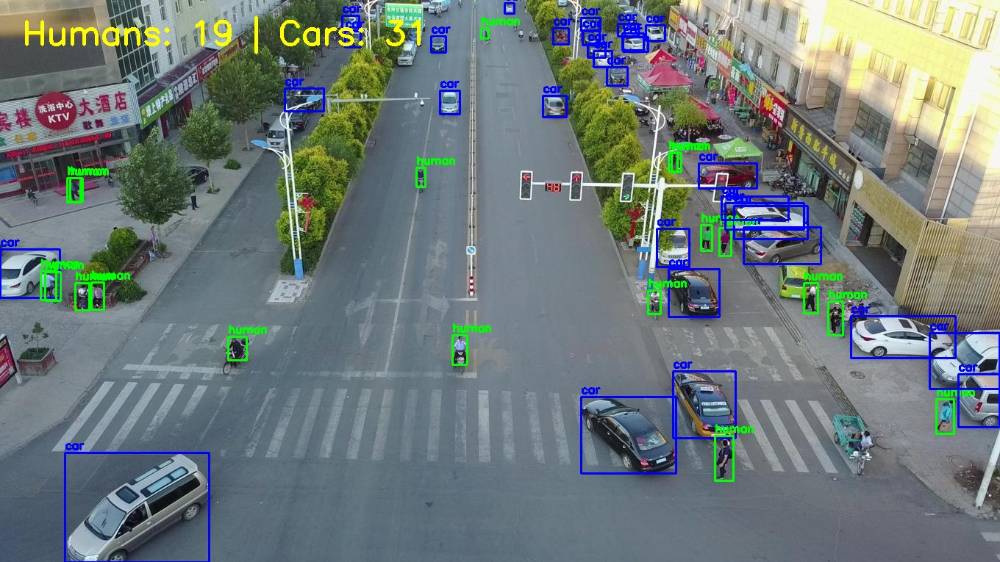

0000280_00001_d_0000612.jpg


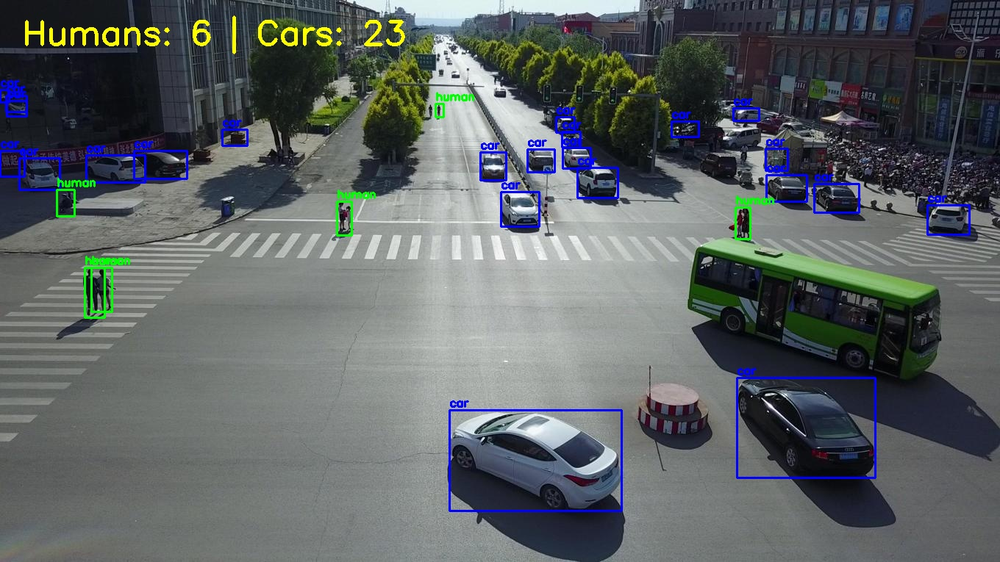

0000301_01201_d_0000162.jpg


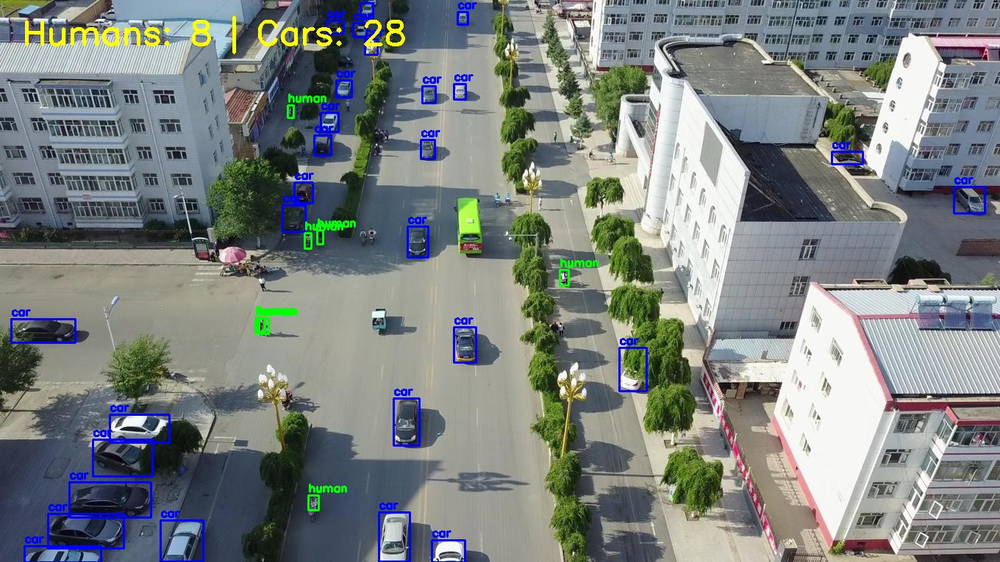

0000303_03401_d_0000200.jpg


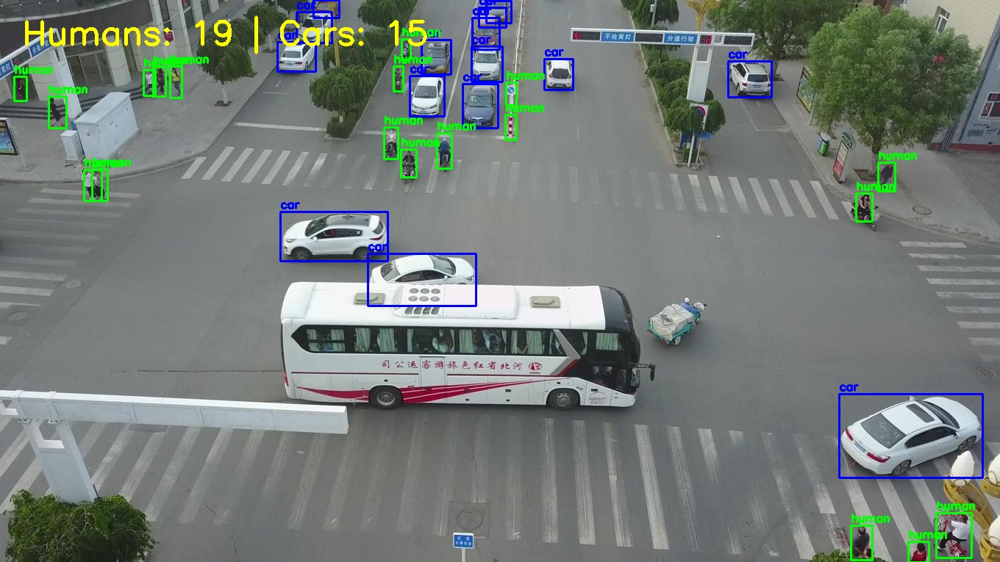

0000335_03333_d_0000060.jpg


In [35]:
print("\n" + "="*60)
print("3. SAMPLE DETECTION OUTPUTS WITH COUNTS")
print("="*60)

display_folder = "display_outputs"
if os.path.exists(display_folder):
    sample_outputs = sorted(os.listdir(display_folder))[:10]
    for img_name in sample_outputs:
        display(Image(filename=os.path.join(display_folder, img_name)))
        print(img_name)
else:
    counted_folder = "counted_outputs"
    if os.path.exists(counted_folder):
        sample_outputs = sorted(os.listdir(counted_folder))[:10]
        for img_name in sample_outputs:
            display(Image(filename=os.path.join(counted_folder, img_name)))
            print(img_name)

In [45]:
print("\n" + "="*60)
print("6. UNIQUE HUMAN COUNT FROM TRACKING")
print("="*60)

print(f"Total unique humans tracked across video: {human_total}")


6. UNIQUE HUMAN COUNT FROM TRACKING
Total unique humans tracked across video: 27


In [52]:
from ultralytics import YOLO
import cv2

model = YOLO("runs/detect/train/weights/best.pt")

cap = cv2.VideoCapture("/content/val_video.mp4")
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

out = cv2.VideoWriter("/content/tracked_output.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model.track(frame, persist=True, tracker="bytetrack.yaml", conf=0.25)

    if results[0].boxes.id is not None:
        annotated = results[0].plot()
    else:
        annotated = frame

    out.write(annotated)
    frame_count += 1

cap.release()
out.release()

print(f"Saved: /content/tracked_output.mp4")
print(f"Total frames processed: {frame_count}")


0: 384x640 26 humans, 17 cars, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 humans, 15 cars, 8.4ms
Speed: 3.5ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 39 humans, 3 cars, 8.8ms
Speed: 3.6ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 humans, 12.6ms
Speed: 3.1ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 9.3ms
Speed: 3.2ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 9.1ms
Speed: 3.1ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 43 humans, 6 cars, 10.0ms
Speed: 3.2ms preprocess, 10.0ms inference, 1.8ms postprocess per imag

In [53]:
from ultralytics import YOLO
import cv2
import numpy as np

model = YOLO("runs/detect/train/weights/best.pt")

cap = cv2.VideoCapture("/content/val_video.mp4")
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

out = cv2.VideoWriter("/content/tracked_humans_only.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model.track(frame, persist=True, tracker="bytetrack.yaml", conf=0.25)[0]

    annotated = frame.copy()

    if results.boxes.id is not None:
        for box, track_id in zip(results.boxes, results.boxes.id):
            cls = int(box.cls[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0])

            if cls == 0:
                cv2.rectangle(annotated, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(annotated, f"human_{int(track_id)}", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    out.write(annotated)
    frame_count += 1

cap.release()
out.release()

print(f"Saved: /content/tracked_humans_only.mp4")
print(f"Total frames processed: {frame_count}")


0: 384x640 26 humans, 17 cars, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 humans, 15 cars, 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 39 humans, 3 cars, 8.1ms
Speed: 3.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 23 humans, 10.3ms
Speed: 4.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 9.0ms
Speed: 3.2ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 8.9ms
Speed: 3.3ms preprocess, 8.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 8.5ms
Speed: 3.7ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 43 humans, 6 cars, 8.6ms
Speed: 3.7ms preprocess, 8.6ms inference, 1.6ms postprocess per image 

**
5. FINAL METRICS AND LIMITATIONS

Overall mAP50: 0.557
Human mAP50: 0.39
Car mAP50: 0.723
Human Recall: 0.347
Car Recall: 0.69
Inference FPS: ~35

----------------------------------------
LIMITATIONS
----------------------------------------
- Human detection weak (mAP50 only 0.39)
- Low recall (0.347) - 65 percent of humans missed
- Small objects below 30 pixels rarely detected
- Occlusion causes missed detections
- False positives on shadows and tree canopies

----------------------------------------
STRENGTHS
----------------------------------------
- Car detection robust (0.723 mAP50)
- ByteTrack successfully assigns unique IDs
- Real-time capable (35 FPS on T4 GPU)
- Complete pipeline from EDA to tracking**